# [Project 3: Camera Calibration and Fundamental Matrix Estimation with RANSAC](https://www.cc.gatech.edu/~hays/compvision/proj3)


(1) Camera Projection Matrix  
(2) Fundamental Matrix Estimation  
(3) Fundamental Matrix with RANSAC  

## Setup

In [1]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
import student_code as sc

## Part 1: Camera Projection Matrix

In [2]:
# Load the data
points_2d = np.loadtxt('../data/pts2d-norm-pic_a.txt')
points_3d = np.loadtxt('../data/pts3d-norm.txt')

# (Optional) Uncomment these four lines once you have your code working with the easier, normalized points above.
# points_2d = np.loadtxt('../data/pts2d-norm-pic_b.txt')
# points_3d = np.loadtxt('../data/pts3d.txt')

### Calculate the projection matrix given corresponding 2D & 3D points

The projection matrix is
 [[ 0.76785834 -0.49384797 -0.02339781  0.00674445]
 [-0.0852134  -0.09146818 -0.90652332 -0.08775678]
 [ 0.18265016  0.29882917 -0.07419242  1.        ]]
The total residual is 0.044535


<IPython.core.display.Javascript object>


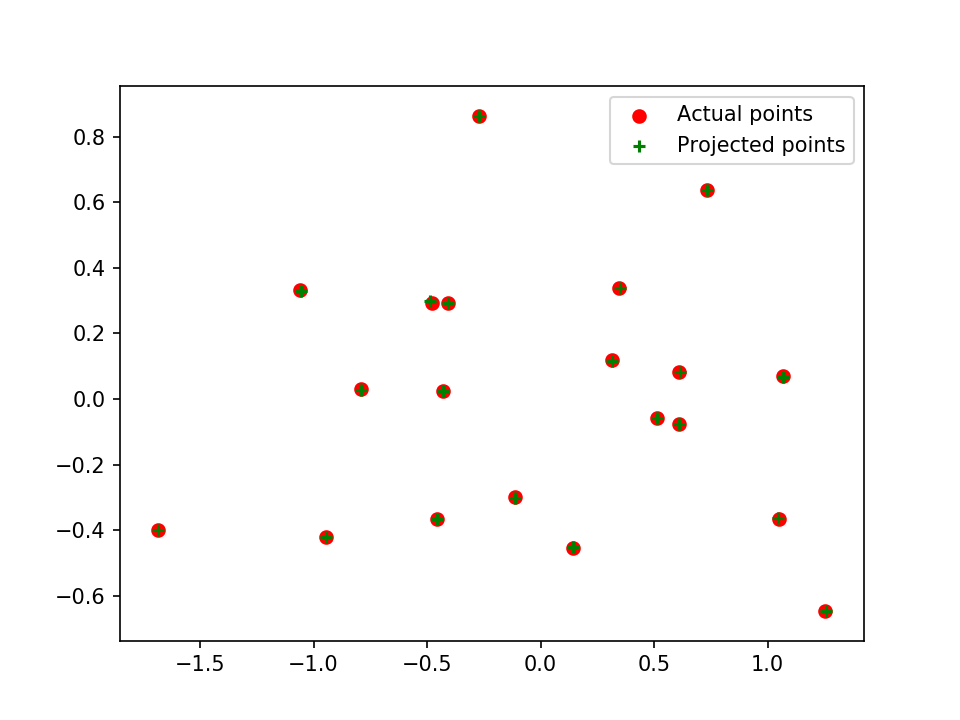

In [3]:
M = sc.calculate_projection_matrix(points_2d, points_3d)
print('The projection matrix is\n', M)

[projected_2d_pts, residual] = evaluate_points(M, points_2d, points_3d);
print('The total residual is {:f}'.format(residual))
visualize_points(points_2d, projected_2d_pts)

### Calculate the camera center using M found from the previous step

The estimated location of the camera is <-1.5126, -2.3517, 0.2827>


<IPython.core.display.Javascript object>


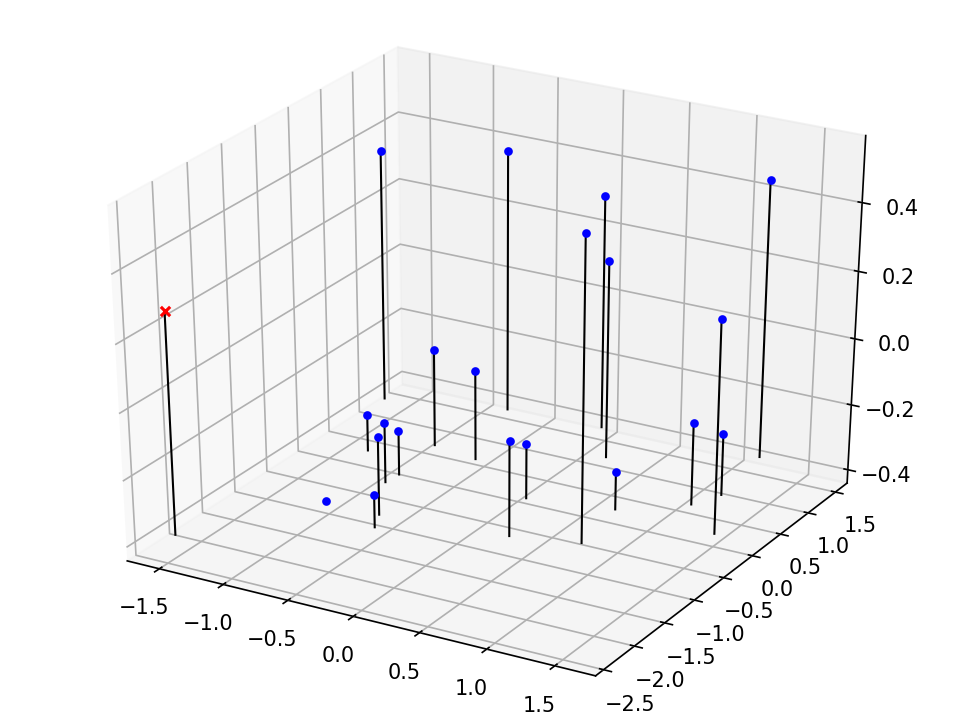

In [4]:
center = sc.calculate_camera_center(M);
print('The estimated location of the camera is <{:.4f}, {:.4f}, {:.4f}>'.format(*center))
plot3dview(points_3d, center)

## Part 2: Fundamental Matrix Estimation

In [5]:
# Load the data
points_2d_pic_a = np.loadtxt('../data/pts2d-pic_a.txt')
points_2d_pic_b = np.loadtxt('../data/pts2d-pic_b.txt')
img_left = load_image('../data/pic_a.jpg')
img_right = load_image('../data/pic_b.jpg')

### Estimate fundamental matrix

<IPython.core.display.Javascript object>


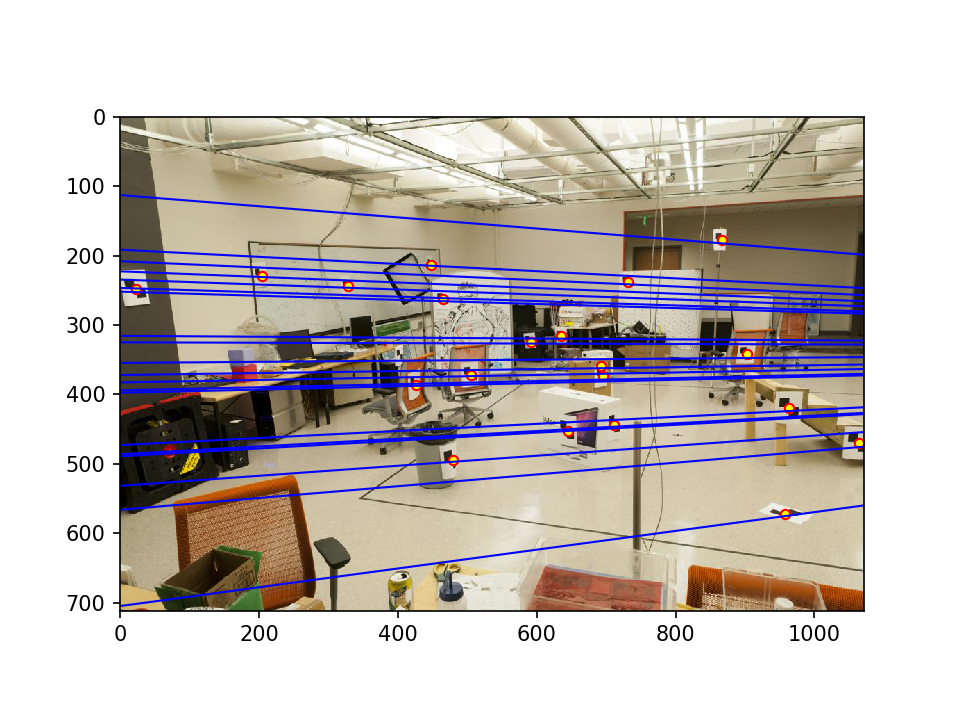

<IPython.core.display.Javascript object>


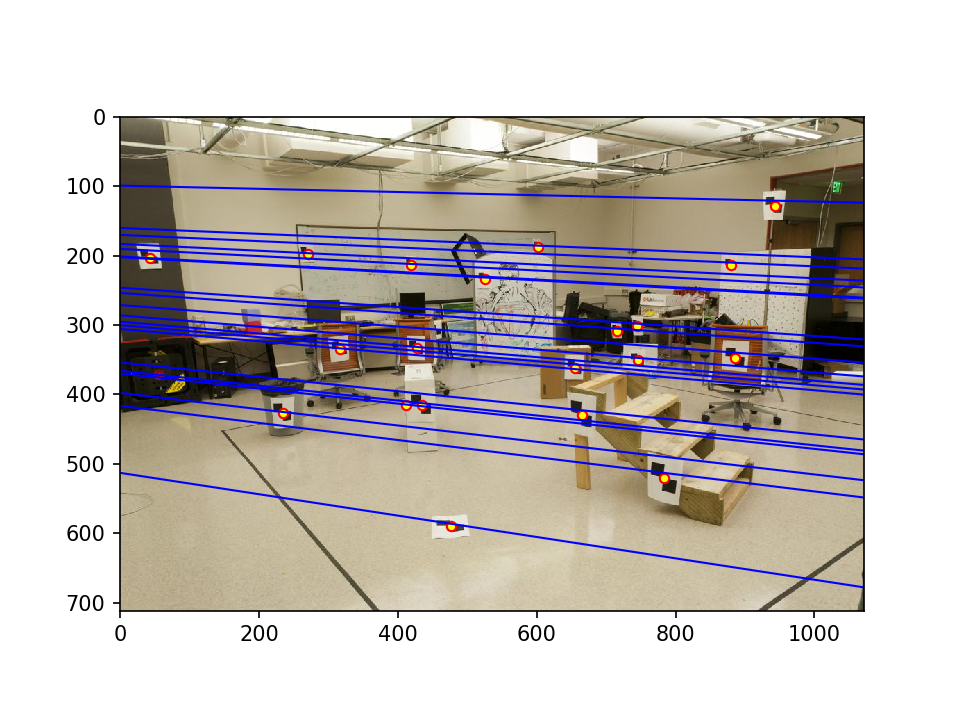

In [6]:
F = sc.estimate_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw epipolar lines using the fundamental matrix
draw_epipolar_lines(F, img_left, img_right, points_2d_pic_a, points_2d_pic_b)

## Part 3: Fundamental Matrix with RANSAC (Szeliski 6.1.4)

**Mount Rushmore**: This pair is easy, and most of the initial matches are correct. The base fundamental matrix estimation without coordinate normalization will work fine with RANSAC. 

**Notre Dame**: This pair is difficult because the keypoints are largely on the same plane. Still, even an inaccurate fundamental matrix can do a pretty good job of filtering spurious matches.  

**Gaudi**: This pair is difficult and doesn't find many correct matches unless you run at high resolution, but that will lead to tens of thousands of ORB features, which will be somewhat slow to process. Normalizing the coordinates seems to make this pair work much better.  

**Woodruff**: This pair has a clearer relationship between the cameras (they are converging and have a wide baseline between them). The estimated fundamental matrix is less ambiguous and you should get epipolar liens qualitatively similar to part 2 of the project.

In [7]:
# Load the data
# Mount Rushmore
pic_a = load_image('../data/Mount Rushmore/9193029855_2c85a50e91_o.jpg'); scale_a = 0.25
pic_b = load_image('../data/Mount Rushmore/7433804322_06c5620f13_o.jpg'); scale_b = 0.37
n_feat = 5e4


pic_a = cv2.resize(pic_a, None, fx=scale_a, fy=scale_a)
pic_b = cv2.resize(pic_b, None, fx=scale_b, fy=scale_b)

Found 1177 possibly matching features


<IPython.core.display.Javascript object>


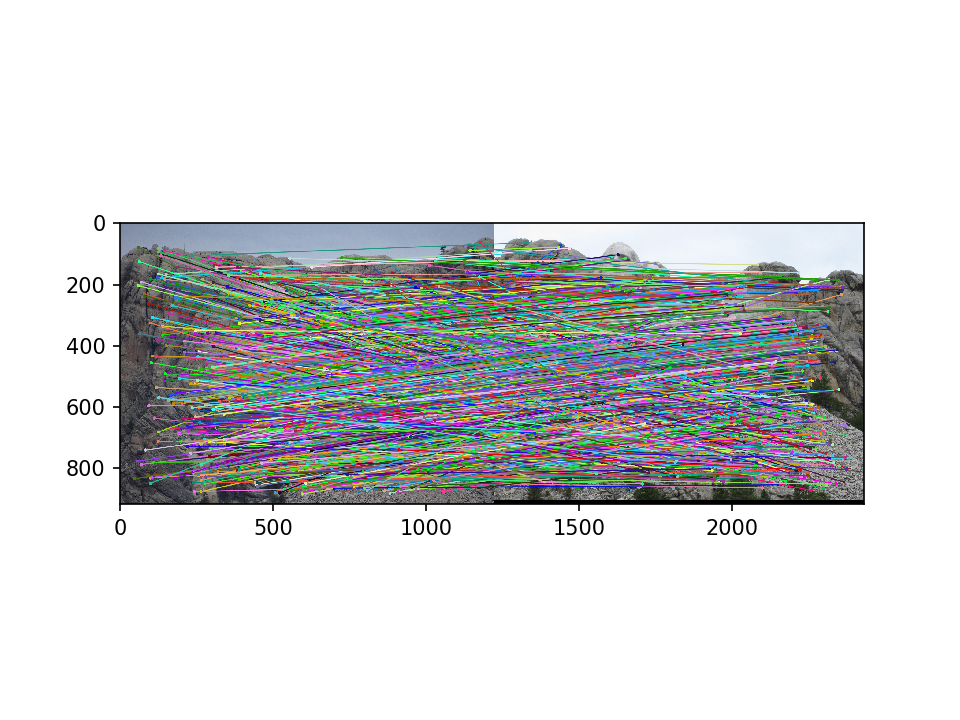

In [8]:
# Finds matching points in the two images using OpenCV's implementation of ORB.
# There can still be many spurious matches, though.
points_2d_pic_a, points_2d_pic_b = get_matches(pic_a, pic_b, n_feat)
print('Found {:d} possibly matching features'.format(len(points_2d_pic_a)))
match_image = show_correspondence2(pic_a, pic_b,
                                   points_2d_pic_a[:, 0], points_2d_pic_a[:, 1],
                                   points_2d_pic_b[:, 0], points_2d_pic_b[:, 1])
plt.figure(); plt.imshow(match_image); plt.show()

### Calculate the Fundamental Matrix using RANSAC

RANSAC is searching over  5xlen(matches) iteration...
RANSAC is searching over 10xlen(matches) iteration...
RANSAC is searching over 15xlen(matches) iteration...
Early stopping! RANSAC completed after 21453 iteration
This equals to 18.23 times the length of the matches set
Achieves 288 inliner over 1177 match points with threshold of 0.050000 


<IPython.core.display.Javascript object>


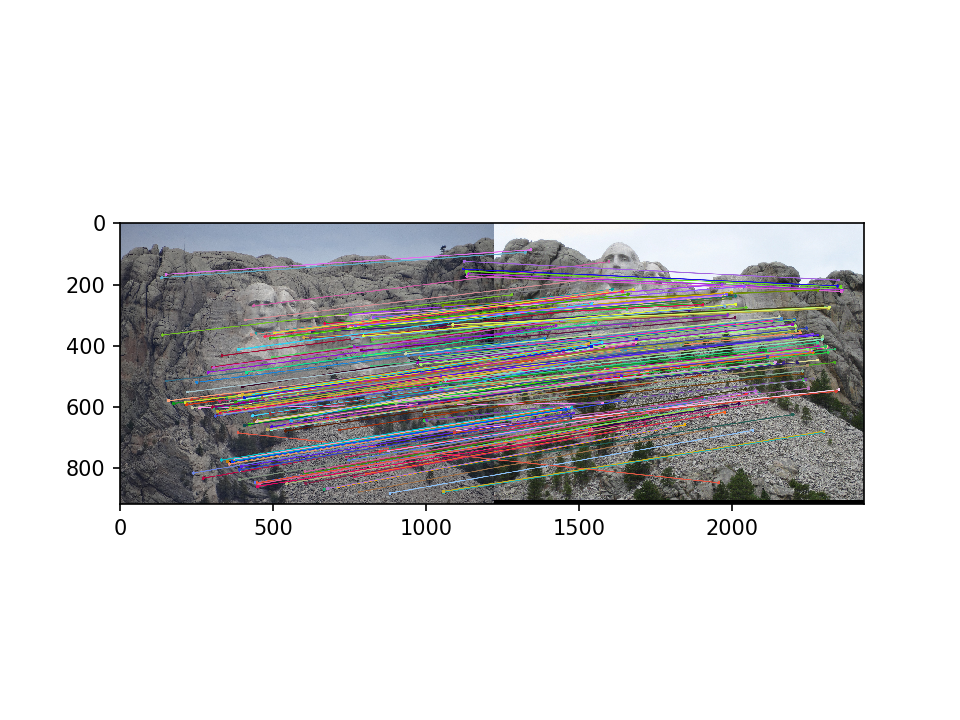

<IPython.core.display.Javascript object>


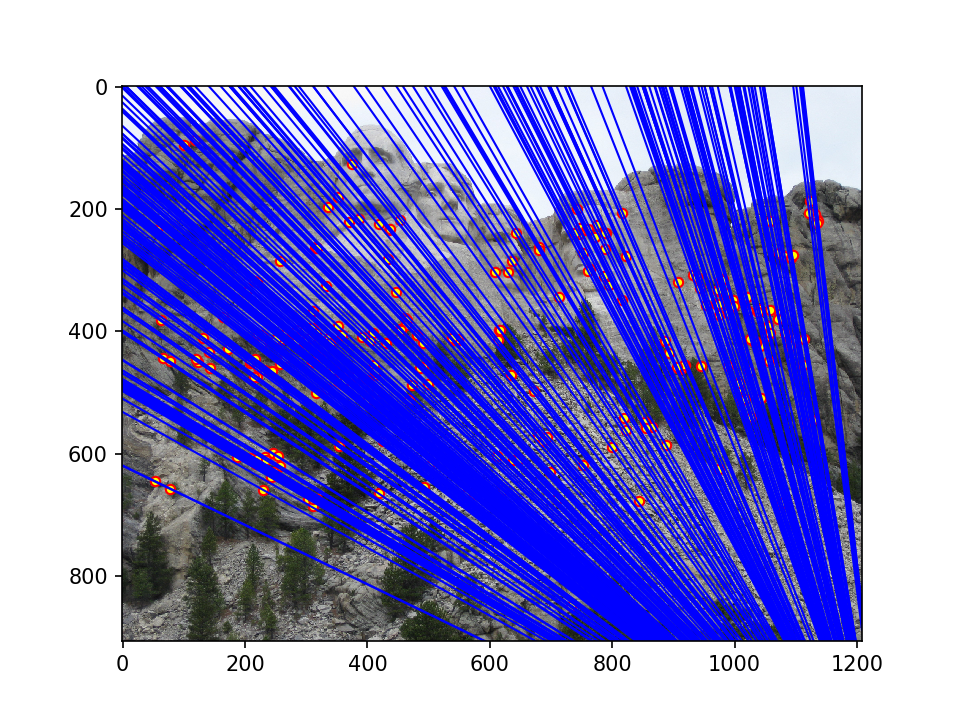

<IPython.core.display.Javascript object>


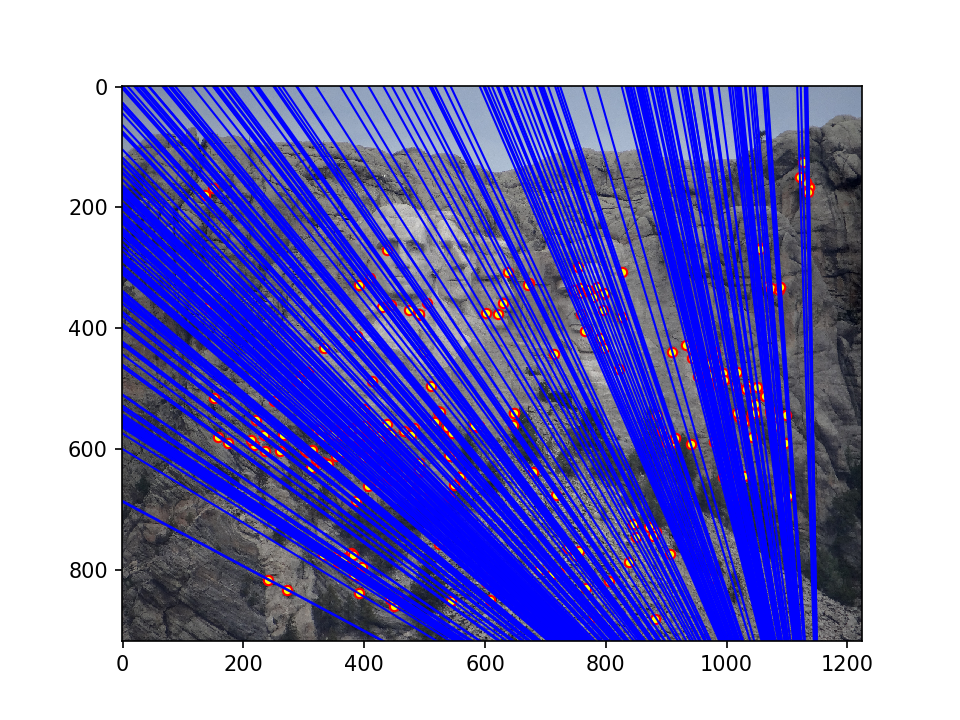

In [9]:
F, matched_points_a, matched_points_b = sc.ransac_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw the epipolar lines on the images and corresponding matches
match_image = show_correspondence2(pic_a, pic_b,
                                   matched_points_a[:, 0], matched_points_a[:, 1],
                                   matched_points_b[:, 0], matched_points_b[:, 1])
plt.figure(); plt.imshow(match_image)
draw_epipolar_lines(F, pic_a, pic_b, matched_points_a, matched_points_b)

### More Test Cases

Found 1282 possibly matching features


<IPython.core.display.Javascript object>


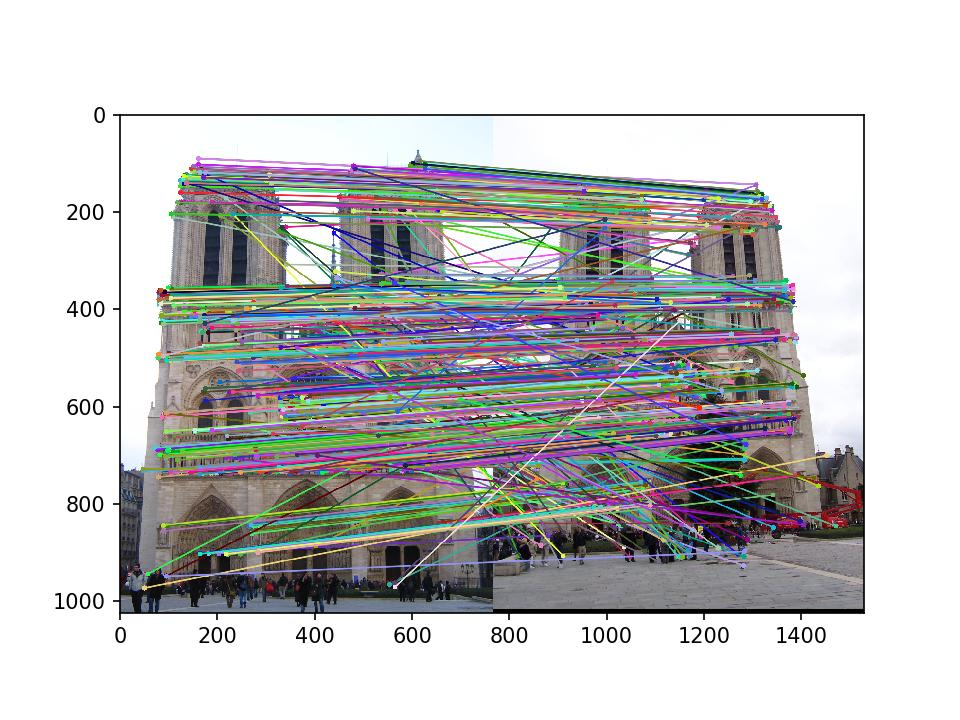

Early stopping! RANSAC completed after 698 iteration
This equals to 0.54 times the length of the matches set
Achieves 568 inliner over 1282 match points with threshold of 0.050000 


<IPython.core.display.Javascript object>


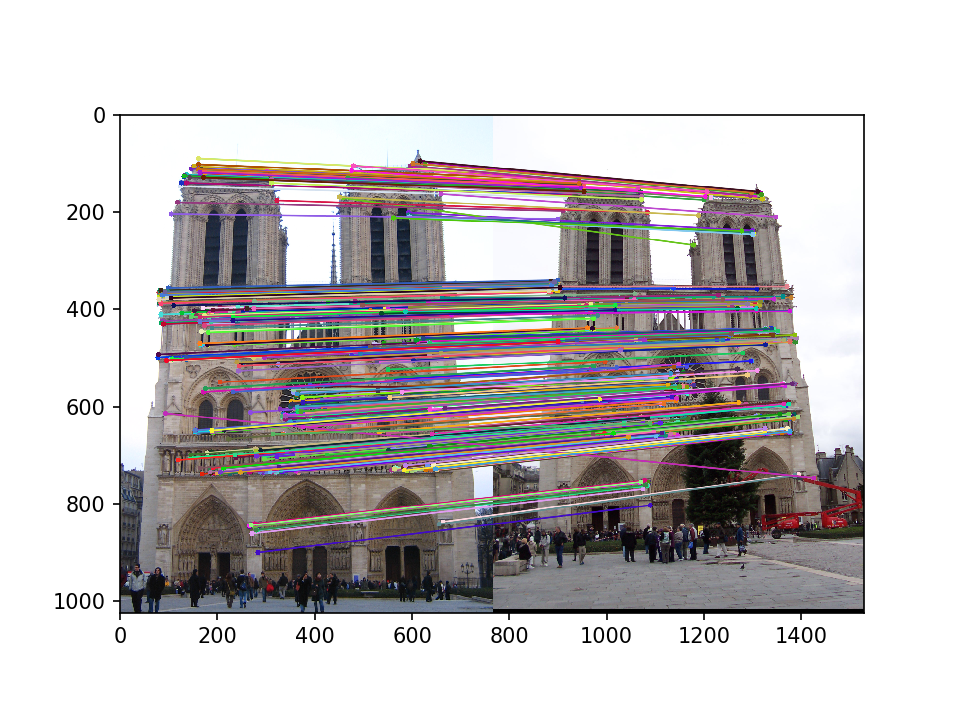

<IPython.core.display.Javascript object>


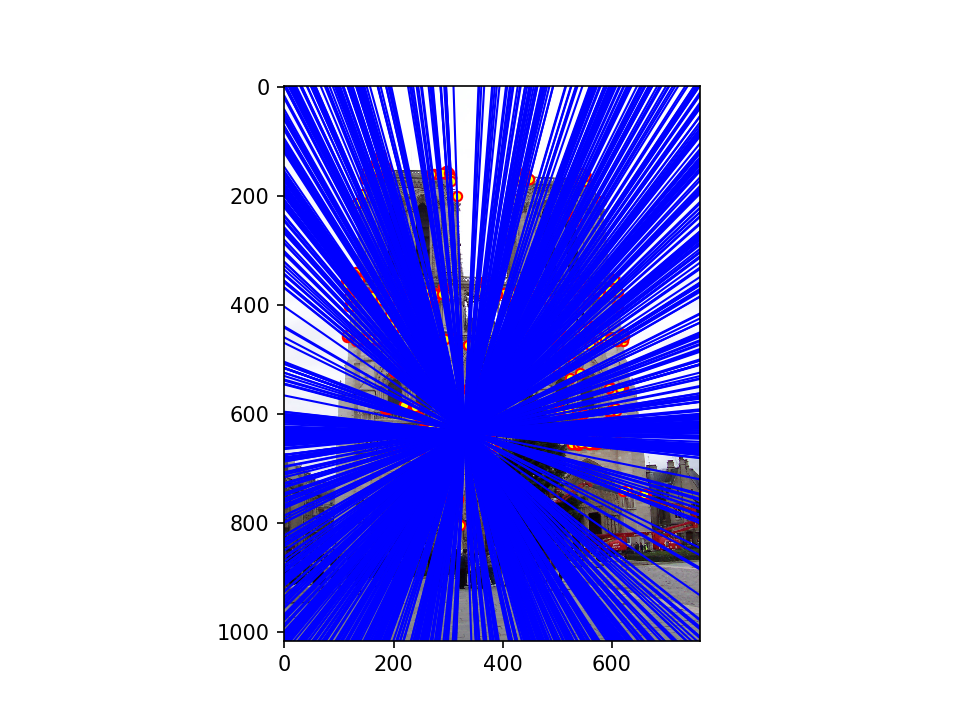

<IPython.core.display.Javascript object>


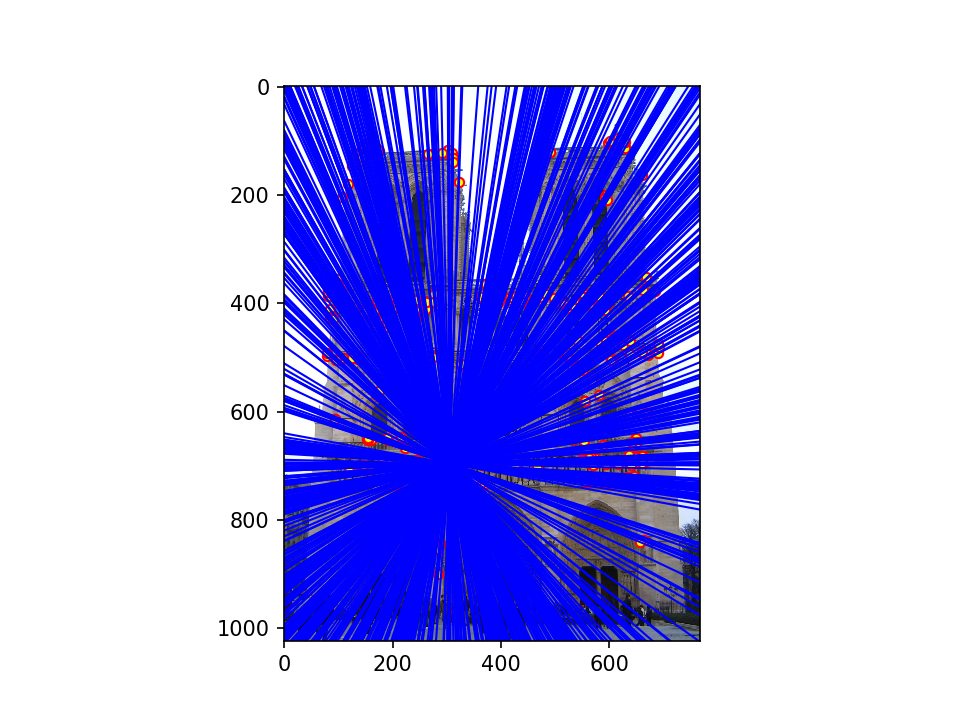

In [10]:
# Load the data
# Mount Rushmore
# pic_a = load_image('../data/Mount Rushmore/9193029855_2c85a50e91_o.jpg'); scale_a = 0.25
# pic_b = load_image('../data/Mount Rushmore/7433804322_06c5620f13_o.jpg'); scale_b = 0.37
# n_feat = 5e4

# Notre Dame
pic_a = load_image('../data/Notre Dame/921919841_a30df938f2_o.jpg'); scale_a = 0.5
pic_b = load_image('../data/Notre Dame/4191453057_c86028ce1f_o.jpg'); scale_b = 0.5
n_feat = 8e3

pic_a = cv2.resize(pic_a, None, fx=scale_a, fy=scale_a)
pic_b = cv2.resize(pic_b, None, fx=scale_b, fy=scale_b)

# Finds matching points in the two images using OpenCV's implementation of ORB.
# There can still be many spurious matches, though.
points_2d_pic_a, points_2d_pic_b = get_matches(pic_a, pic_b, n_feat)
print('Found {:d} possibly matching features'.format(len(points_2d_pic_a)))
match_image = show_correspondence2(pic_a, pic_b,
                                   points_2d_pic_a[:, 0], points_2d_pic_a[:, 1],
                                   points_2d_pic_b[:, 0], points_2d_pic_b[:, 1])
plt.figure(); plt.imshow(match_image)

F, matched_points_a, matched_points_b = sc.ransac_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw the epipolar lines on the images and corresponding matches
match_image = show_correspondence2(pic_a, pic_b,
                                   matched_points_a[:, 0], matched_points_a[:, 1],
                                   matched_points_b[:, 0], matched_points_b[:, 1])
plt.figure(); plt.imshow(match_image)
draw_epipolar_lines(F, pic_a, pic_b, matched_points_a, matched_points_b)

Found 1037 possibly matching features


<IPython.core.display.Javascript object>


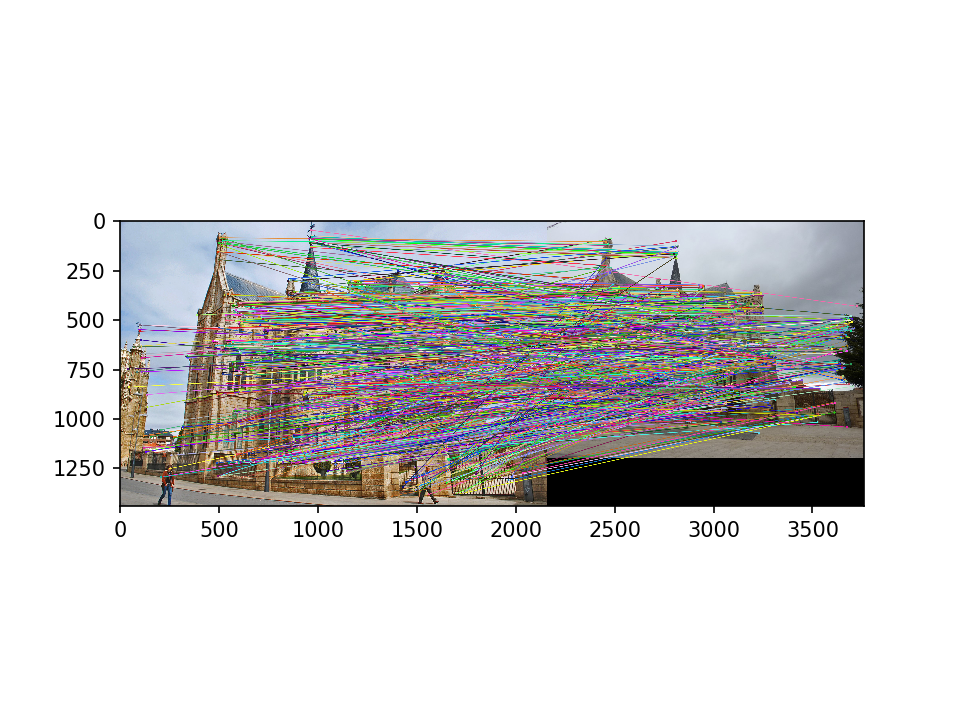

RANSAC is searching over  5xlen(matches) iteration...
RANSAC is searching over 10xlen(matches) iteration...
RANSAC is searching over 15xlen(matches) iteration...
RANSAC is searching over 20xlen(matches) iteration...
Early stopping! RANSAC completed after 22359 iteration
This equals to 21.56 times the length of the matches set
Achieves 252 inliner over 1037 match points with threshold of 0.050000 


<IPython.core.display.Javascript object>


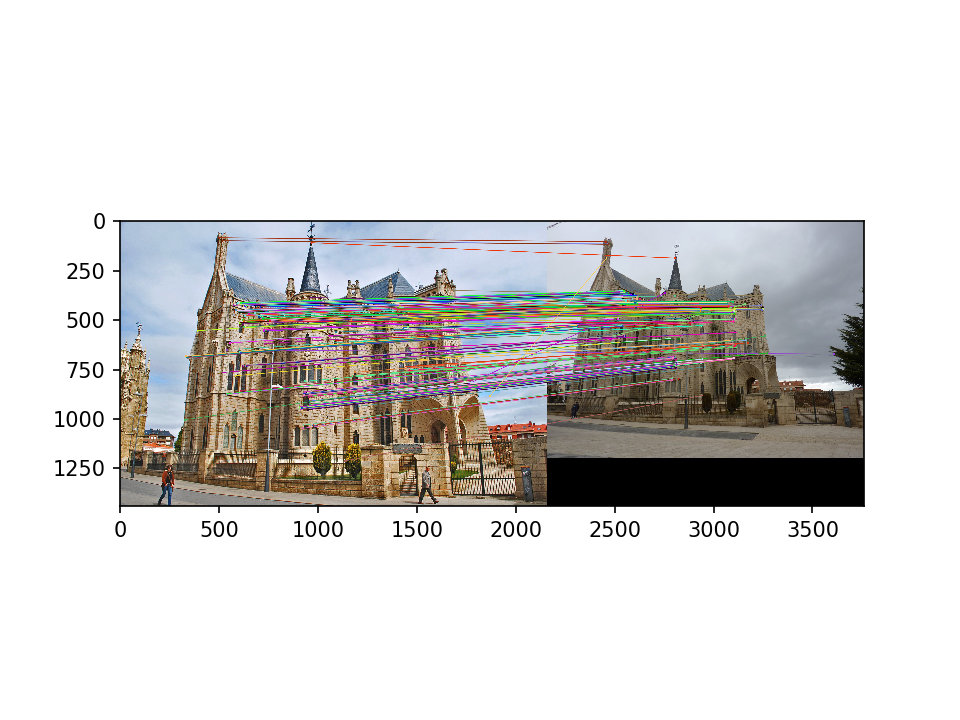

<IPython.core.display.Javascript object>


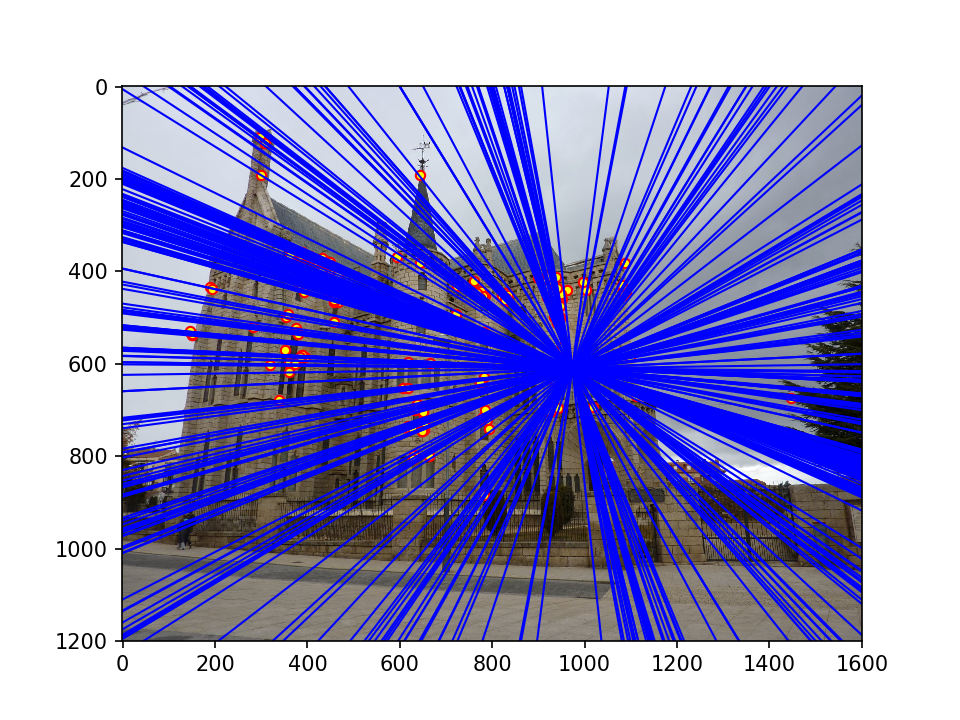

<IPython.core.display.Javascript object>


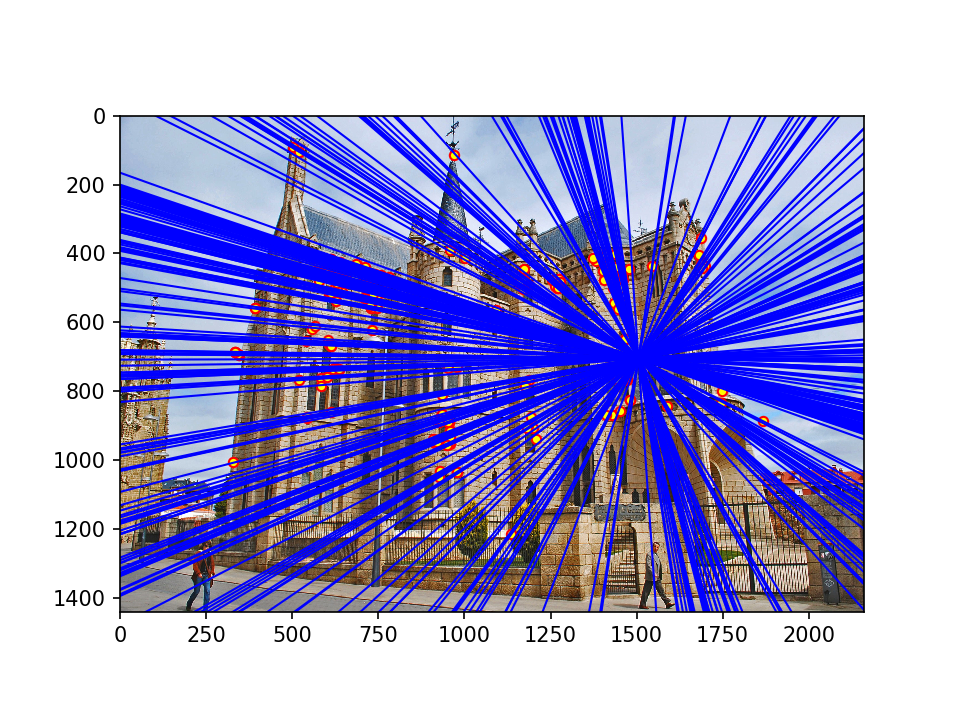

In [11]:
# Load the data
# Gaudi
pic_a = load_image('../data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg'); scale_a = 0.8
pic_b = load_image('../data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg'); scale_b = 1.0
n_feat = 2e4

pic_a = cv2.resize(pic_a, None, fx=scale_a, fy=scale_a)
pic_b = cv2.resize(pic_b, None, fx=scale_b, fy=scale_b)

# Finds matching points in the two images using OpenCV's implementation of ORB.
# There can still be many spurious matches, though.
points_2d_pic_a, points_2d_pic_b = get_matches(pic_a, pic_b, n_feat)
print('Found {:d} possibly matching features'.format(len(points_2d_pic_a)))
match_image = show_correspondence2(pic_a, pic_b,
                                   points_2d_pic_a[:, 0], points_2d_pic_a[:, 1],
                                   points_2d_pic_b[:, 0], points_2d_pic_b[:, 1])
plt.figure(); plt.imshow(match_image)

F, matched_points_a, matched_points_b = sc.ransac_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw the epipolar lines on the images and corresponding matches
match_image = show_correspondence2(pic_a, pic_b,
                                   matched_points_a[:, 0], matched_points_a[:, 1],
                                   matched_points_b[:, 0], matched_points_b[:, 1])
plt.figure(); plt.imshow(match_image)
draw_epipolar_lines(F, pic_a, pic_b, matched_points_a, matched_points_b)

Found 1137 possibly matching features


<IPython.core.display.Javascript object>


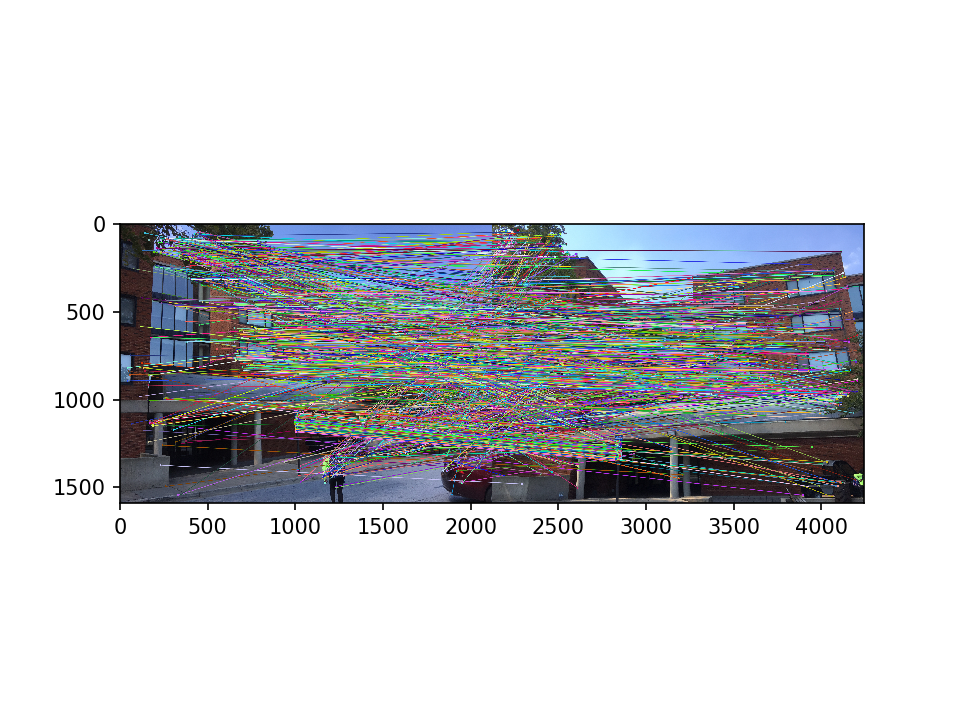

RANSAC is searching over  5xlen(matches) iteration...
RANSAC is searching over 10xlen(matches) iteration...
Early stopping! RANSAC completed after 11428 iteration
This equals to 10.05 times the length of the matches set
Achieves 309 inliner over 1137 match points with threshold of 0.050000 


<IPython.core.display.Javascript object>


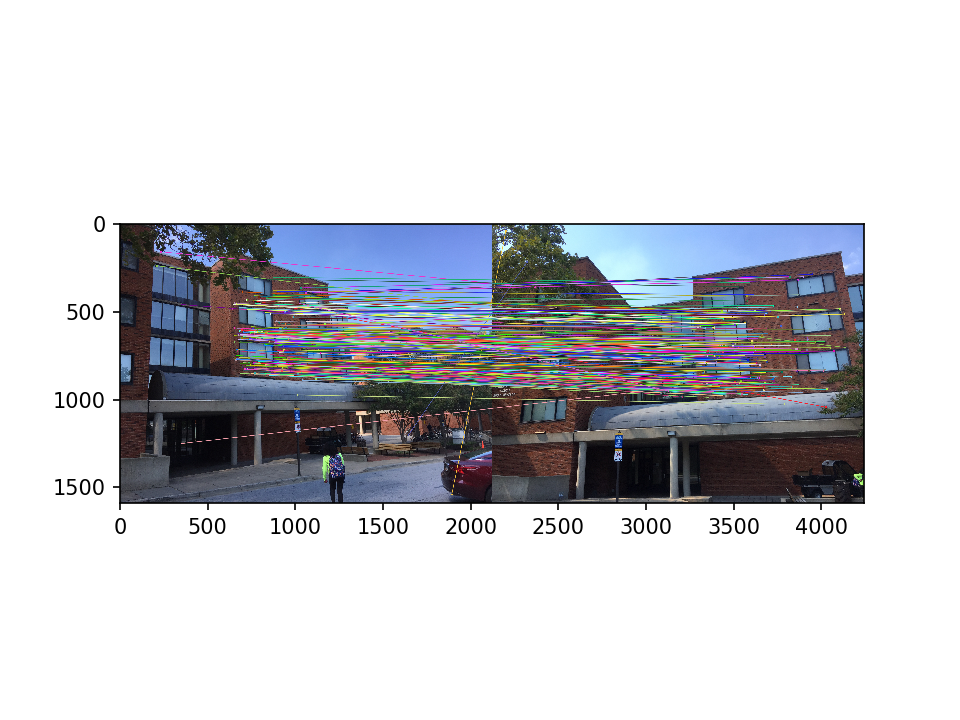

<IPython.core.display.Javascript object>


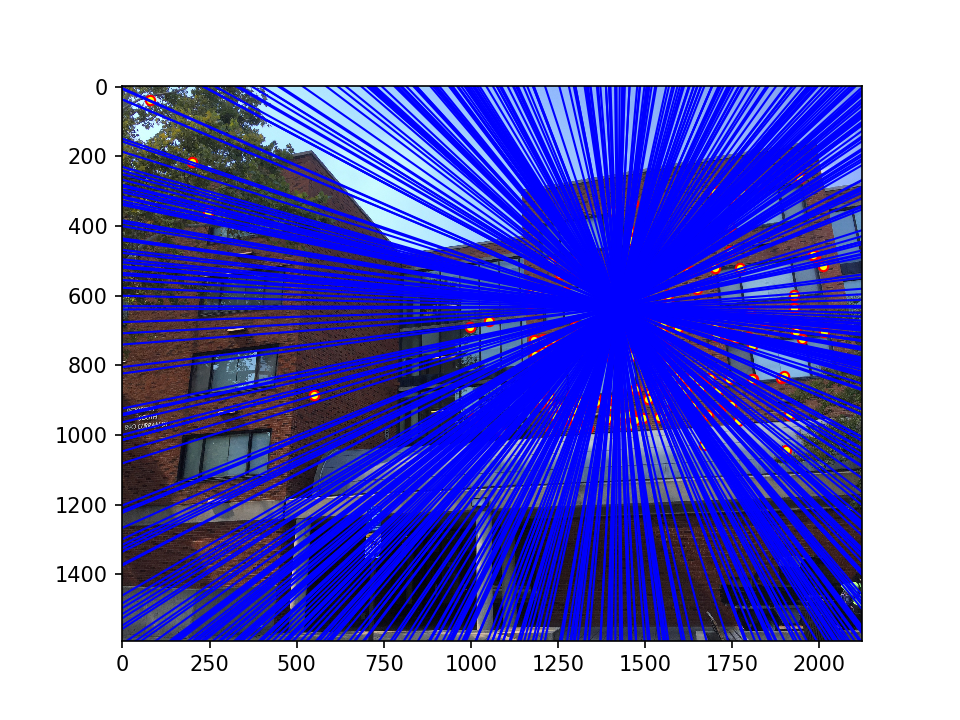

<IPython.core.display.Javascript object>


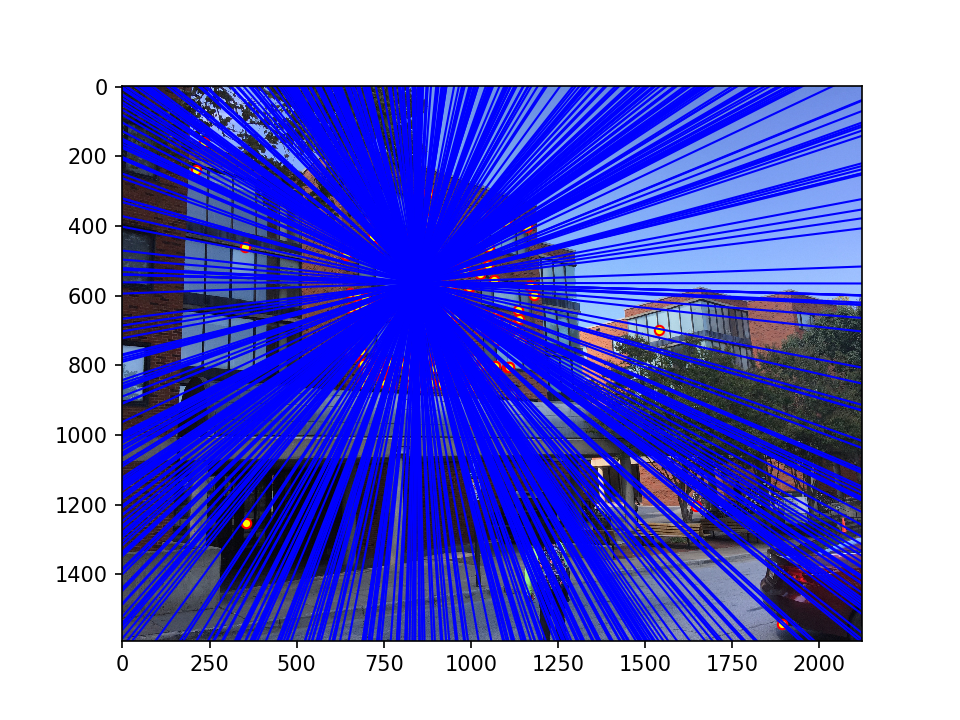

In [12]:
# Load the data
# Woodruff
pic_a = load_image('../data/Woodruff Dorm/wood1.jpg'); scale_a = 0.65
pic_b = load_image('../data/Woodruff Dorm/wood2.jpg'); scale_b = 0.65
n_feat = 5e4

pic_a = cv2.resize(pic_a, None, fx=scale_a, fy=scale_a)
pic_b = cv2.resize(pic_b, None, fx=scale_b, fy=scale_b)

# Finds matching points in the two images using OpenCV's implementation of ORB.
# There can still be many spurious matches, though.
points_2d_pic_a, points_2d_pic_b = get_matches(pic_a, pic_b, n_feat)
print('Found {:d} possibly matching features'.format(len(points_2d_pic_a)))
match_image = show_correspondence2(pic_a, pic_b,
                                   points_2d_pic_a[:, 0], points_2d_pic_a[:, 1],
                                   points_2d_pic_b[:, 0], points_2d_pic_b[:, 1])
plt.figure(); plt.imshow(match_image)

F, matched_points_a, matched_points_b = sc.ransac_fundamental_matrix(points_2d_pic_a, points_2d_pic_b)

# Draw the epipolar lines on the images and corresponding matches
match_image = show_correspondence2(pic_a, pic_b,
                                   matched_points_a[:, 0], matched_points_a[:, 1],
                                   matched_points_b[:, 0], matched_points_b[:, 1])
plt.figure(); plt.imshow(match_image)
draw_epipolar_lines(F, pic_a, pic_b, matched_points_a, matched_points_b)

### Writeup Section

In [13]:
###### TO DO #######


###### Describe your algorithm and dsicuss any extra credits you did ##########

## Normalized for Fundamental matrix

1. First, I write the function `normalization_matrix_and_padding_ones` to normalize all points with the techniques written in the project description. The scale is to make sure that the average sum of square equals to 2. The function returns the transfomration matrix `T` and the normalized points `points_normalized`.

2. Second, I use the `np.linalg.lstsq` to solve for the least square error of the `8-points equation` of all the normalized points. The F-matrix is then de-normalized with `Ta`, `Tb`

3. Third, the F matrix has rank 2, so I use `SVD` techniques and set the `smallest eigenvector to 0`. T restore the F-matrix with SVD reverse transform.

# RANSAC algorithm

1. Early stopping:

After each iteration, I calculate the percentage of the inliners over the total number of possible matches pairs. With this percentage, I can calculate the number of `required iterations` to reach the confidence level of 0.99. If the `number of iteration` exceeds this `required iterations`, I will let the RANSAC to perform early stopping.

The `required_iterations = max_iter = np.log(1.0-confidence)/(np.log(1.0-p**6)-10**-8)`
Additionally, I set the maximum iteration to `100*len(matches)` to prevent perpeptual iterations.

2. Inliners/Outliners:

Score is the distance from the matches to the epi-lines which is calculated as `matched_b.T.dot(F).matched_a`. If this score exceed the `therehold=0.5`, I consider it as outliners. I tune this hyperparameters to get the resonable mathching. I set `random seed number = 2` after some trial and errors.